### 1. Overview
This notebook contains worked examples for algorithmic generation of molecules.<br><br>
Functions are stored in elsewhere in the following _.py_ files.<br><br>
_GenerativeSelfies_ handles generative molecular design _via_ selfies; imported as _gensel_ module. <br>
_GenerativeGroupSelfies_ handles generative molecular design _via_ group-selfies; imported as _grpsel_ module.<br>
_FilterMolecules_ handles Filtering operations, sub-structure searching etc; imported as _filmol_ module.<br>
_GeometryOperations_ transforms text representations (smiles) into 3D coordinates and interfaces with QM software (Mopac, Gaussian); imported as _geops_ module<br><br>
We'll also want _time_ (for timing), _numpy_ for maths, _matplotlib_ for plotting, and some core _rdkit_ functionality for drawing stuff

In [2]:
import time
import numpy as np
import matplotlib.pyplot as plt
from rdkit import Chem
from rdkit.Chem import Draw

import GenerativeSelfies as gensel
import GenerativeGroupSelfies as grpsel
import FilterMolecules as filmol
import GeometryOperations as geops

### 2. Generating a single generation of new structures 
Set the variable _smi_ to be the smiles string we are interested in. <br>

Call _gensel.StonedEngine_ to generate new mutant structures from _smi_. The scoring method is built into rdkit, and the variable _samples_ controls the number of output structures. You can use the AP/PHCO/BPF/BTF/PAT/ECFP4/ECFP6/FCFP4/FCFP6 methods. <br><br>
Some timing information is returned, along with a histogram which shows a breakdown of scoring. These can be turned off by setting _silent_ to _False_ (vide infra)

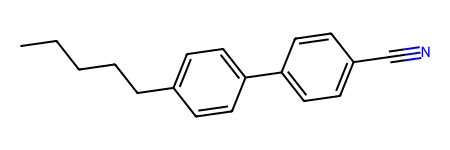

Randomized molecules (in SELFIES) time:  0.05700421333312988
Mutation obtainment time (back to smiles):  2.456005811691284
Unique mutated structure obtainment time:  0.31003665924072266
Fingerprint calculation time:  0.5879237651824951
Total time:  3.411965847015381



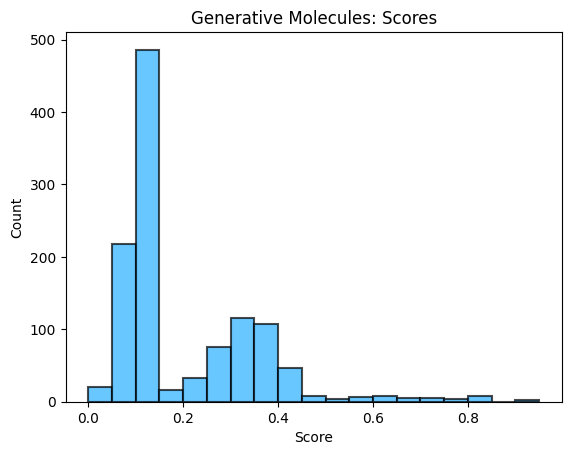

In [3]:
smi = 'CCCCCc1ccc(c2ccc(C#N)cc2)cc1' # 5CB as smiles 
mol_ = Chem.MolFromSmiles(smi)
display(mol_)

# a single round of mutations using StonedEngine function
Mutants,Scores = gensel.StonedEngine(smi,method='FCFP6',samples=250,silent=False)

### 3. Filtering by Substructure
We can use the function _SubstructureFilter_ in the _FilterMolecules_ module to look for specific smiles substrings within a list of molecules. So say we want to find examples of molecules in our generative output that have alkyl ethers, we would search for 'CO'.<br><br> 

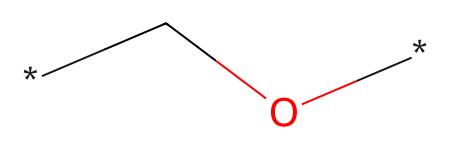

I looked at 1172 molecules to find those with the substructure: CO
Total of 1095 molecules have no substructure match
Total of 77 molecules have a substructure match


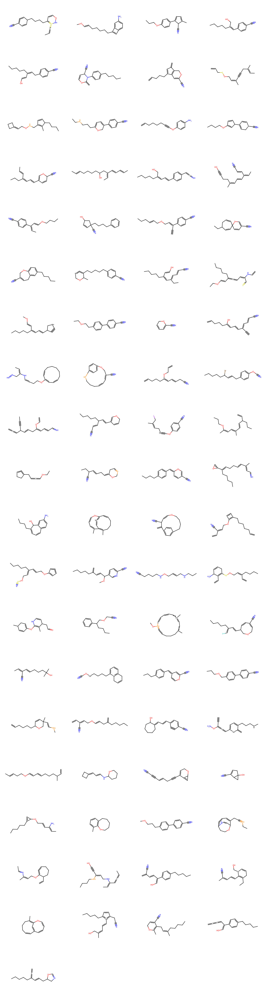

In [4]:
substructure = 'CO'
mol_ = Chem.MolFromSmiles('[*]' + substructure + '[*]')
display(mol_)

Hits,Misses = filmol.SubstructureFilter(Mutants,substructure) 

### 4. Filtering by Score
We can use the function _FilterScore_ in the _FilterMolecules_ module to look for molecules within a list of molecules whose score is within a certain window. <br>
We pass our list of molecules (here, _Mutants_) and list of scores (here, _Scores_). <br>
The flag _Sort_ lets us sort the output on score when _True_.<br>
The flag _Unique_ means we filter out any duplicates. <br>
_Threshold_ is our midpoint of scores, and _range_ is how far we can deviate from this midpoint. Default to 0.7 and 0.2, respectively.
<br>
In this worked example we are looking for moleucles that score quite well, but not 1 (because we want some difference in structure.). 
<br>
<br>
We can also use _SaveSmilesScore_ to write the molecules (as Smiles) along with their scores to a .csv file for later retrieval.


Filtering for scores in range 0.3:0.7
299 Input structures were filtered to 299 unique structures
Total of 299 molecules after filtering scores


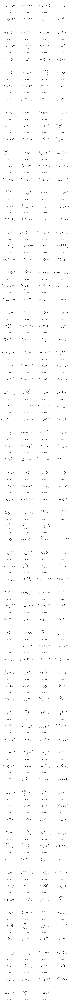

saved structures and scores as StructureMatches.csv


In [5]:
SmiList,ScoresList = filmol.FilterScore(Mutants,Scores,
                                        Sort=True,
                                        Unique=True,
                                        Threshold=0.5,
                                        Range=0.2)

filmol.SaveSmilesScores(SmiList,ScoresList,'StructureMatches.csv')

### 5. Filtering by Features
Sometimes we want to filter things out by certain broad features rather than specific substructures or scores. For example; we are thinking about LCs, so do we want things with _no rings_? If we are considering synthesising molecules, do we want _large rings_ like cyclododecane in our molecule? If we want to find the next RM734, do we really want _lots of rotatable bonds_? <br><br> 
The function _FilterStructures_ in _filmol_ will sort you out here.<br><br>
We pass a list of smiles strings (_smiles_) and specify some limits:<br>
_MinRing_  - must not contain any rings with less than this number of atoms<br>
_MaxRing_  - must not contain any rings with more than this number of atoms<br>
_Rotors_   - the maximum number of contiguous rotatable bonds<br>
_CountCOO_ - the molecule should have _exactly_ this number of esters, or it can be _False_
_MinRings_ - the minimum number of rings<br>
_MaxRings_ - the maximum number of rings<br><br>
By default, failing molecules will be drawn and labeled with the reason(s) for their faliure; molecules _can_ fail for multiple reasons, but depending on the order these are found they might not _all_ get flagged with labels

Total of 299 molecules initially
Total of 13 molecules were filtered out
Total of 286 molecules were not filtered out


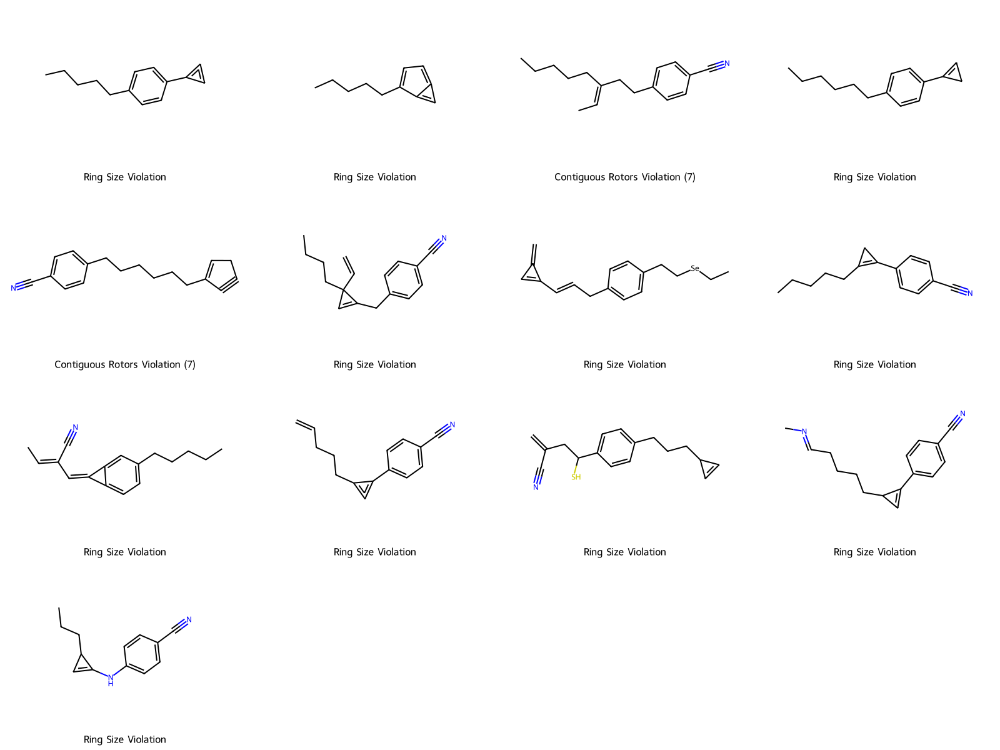

In [6]:
RetainList,RejectList,RejectLabel = filmol.FilterStructures(SmiList,
                                                            MinRing=4,
                                                            MaxRing=5,
                                                            Rotors=7,
                                                            CountCOO=False,
                                                            MinRings=1,
                                                            MaxRings=8)

### 6. Basic Genetic Search
Here we implement a genetic search algorithm to generate new molecular species algorithmically. In this example we use the LC material 5CB, but you can change the smiles string to whatever you like. <br><br> An input structure is given as a smiles string, _smi_. <br><br>
We are going to generate loads of structures and score them with a fingerprinting method, then use those that score 'well' to seed a new round of generation.<br><br>
We specify:<br>
_Generations_ - the number of generations<br>
_Threshold_   - the midpoint of scoring that will remain after filtering<br>
_Range_       - the range we can deviated from _Threshold_ (i.e. +/-)<br>
_method_      - the fingerprinting method used, e.g. FCFP6; these are builtin to rdkit<br>
_samples_     - the number of samples to take; correlates to number of structures returned <br>
<br>
The returned lists _AllSmi_ and _AllScores_ contain smiles strings and scores for all non-filtered molecules. The list _AllLabels_ is basically just used for plotting.<br><br>

Lastly, we save the resulting array to .csv for retrieval.

Generation 0 has 1 molecules
Generation 1 has 4 molecules
Generation 2 has 12 molecules
Generation 3 has 43 molecules
** Final Iteration **
Generation 4 has 108 molecules


C:\ProgramData\Anaconda3\envs\stoned2\Lib\site-packages\rdkit\Chem\Draw\IPythonConsole.py:258: UserWarning: Truncating the list of molecules to be displayed to 400. Change the maxMols value to display more.
  warnings.warn(


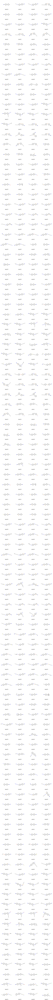

saved structures and scores as GeneticSearch.csv


In [7]:
smi = 'CCCCCc1ccc(c2ccc(C#N)cc2)cc1'

# set some parameters that control how our genetic search works
Generations = 5  # number of generations to screen

Threshold = 0.6  # threshold midpoint for filter
Range = 0.1     # threshold range

method='FCFP6'   # scoring method (builtin)
samples = 20     # samples per search (i.e. per member per generation)

InitialSmi = []
NewSmi  = []
AllSmi = []
AllScores =[]
AllLabels =[]

for n in range(0,Generations): # loop over all generations
    if n == 0:
        InitialSmi = [smi]
    if n != 0:
        InitialSmi = NewSmi
    NewSmi = [] # reset this before each new generation
    if n == Generations-1:
        print('** Final Iteration **')
        
    print('Generation ' + str(n) + ' has ' + str(len(InitialSmi)) + ' molecules')
    for smiles in InitialSmi:
        Mutants,Scores = gensel.StonedEngine(smiles,
                                         method=method,
                                         samples=samples,
                                         silent=True)
        
        Scores = gensel.get_fp_scores(Mutants, 
                                  target_smi=smi, 
                                  fp_type=method)
        
        Filtered,FilteredScores=filmol.FilterScore(Mutants,
                                                   Scores,
                                                   Sort=True,
                                                   silent=True,
                                                   Threshold=Threshold,
                                                   Range=Range)
        NewSmi +=Filtered
        AllLabels += [('\nGeneration : ' + str(n))] * len(FilteredScores)
        AllScores += FilteredScores
        AllSmi += Filtered
        
if True:
    #make a legend (Ledge) for the grid plot:
    b = ['Score: ' + str(np.round(Score,4)) for Score in AllScores]
    a = ['\n' + LocalLabel for LocalLabel in AllLabels]
    Ledge = (["{}{:02}".format(b_, a_) for a_, b_ in zip(a, b)])

    #use the MolToGridImage engine for plotting:
    display(Draw.MolsToGridImage([Chem.MolFromSmiles(x) for x in AllSmi],          # draw 
                           molsPerRow=4, 
                           legends=Ledge,
                           subImgSize=(400,300),
                           maxMols=400))
    
filmol.SaveSmilesScores(SmiList,ScoresList,'GeneticSearch.csv')

### 7. Interfacing with External QM Software
More often than not, we will want to run some sort of electronic structure calculation on generated molecules. In fact, we probably then pass this output of algorithmically generated molecules to another program to generate our own scoring external to rdkit (e.g. Pytorch).<br><br>
In the example below, we are using _WriteGauss_ in _geops_ to create a input for the Gaussian software package for all molecules we generate. There is an (untested) function for writing Mopac input files also. <br><br>
We specify _BaseFileName_, _Processors_ and _Memory_ as workspace variables so that we can also quickly create a jobsubmission script using _MakeSGEJob_ for execution of multiple jobs on a HPC (in this case Sun Grid Engine, SGE) on the fly.
<br><br>
We loop over all molecules in _SmiList_ and create a basic Gaussian job (usually running something like #P OPT FREQ POLAR VOLUME). <br><br>


In [ ]:
BaseFileName = 'job_'
Processors = 1
Memory = 2

for i,mol in enumerate(SmiList): # loop over our retain list
    #smi = Chem.MolToSmiles(mol) # convert rdkit mol object back to smiles
    geops.WriteGauss(smi, BaseFileName + str(i),mem=Memory,nproc=Processors)
    
geops.MakeSGEJob(filename=BaseFileName, vmem=Memory,nproc=Processors,startjob=1,endjob=len(SmiList))

### 8. Structure Generation with Group-Selfies
To use group-selfies we need a fragment of molecules. Because here we are thinking about liquid crystals (LCs) we use a custom list of over 350k LCs (or likely LCs) embedded as smiles strings which itself is generated programatically from lists of known fragments (e.g. phenyl, cyano, pentyl.. yada yada yada) using a semantically consistent language for LCs and their constituent parts (methyl, ethyl, butyl, futile...).<br><br>
First we parse this fragment database and take a subset. The 'mmpa' method seems good but slower than 'default'

In [7]:
import GenerativeGroupSelfies as grpsel
import random

from rdkit import Chem

random.seed(42)

fra = grpsel.ParseFragments(Subset=5000,Method='default',Display=False) #method can be 'mmpa' or 'default'
Grammar = grpsel.GrammarFromFrag(fra)

100%|█████████████████████████████████████████████████████████████████████████████| 5000/5000 [00:25<00:00, 193.36it/s]


The downside of fragmenting a (large) list of compounds is our subset is not necesarily representitive of the diversity we are targeting. <br><br>An alternative is to simply use a precompiled list of fragments; but this has its own drawbacks that obscure groups (e.g. 1,4-cubanes) are weighted equally to common ones like 1,4-benzenes.

Alternatively, we can parse a prebuilt list of fragments. The module _grpsel_ has some functions for generating a list of fragments which you can modify easily. <br><br>

We'll use the _DefinedFragments_ function to load this set of fragments, then use this to fragment a well-known siloxane-tipped LC material ([2Si]8OCB) into its constituant parts:

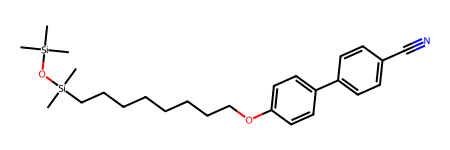

The molecule above is made of the fragments below:


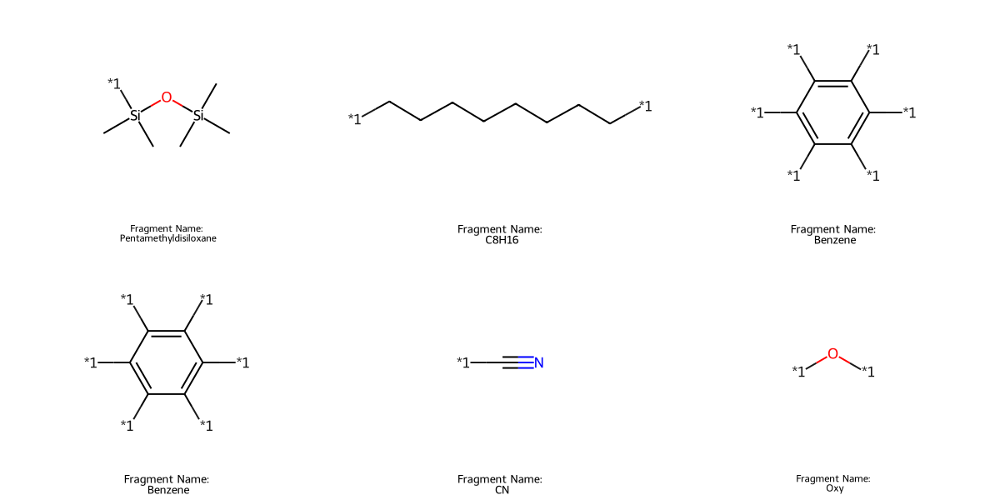

In [8]:
import GenerativeGroupSelfies as grpsel
Grammar,_ = grpsel.DefinedFragments() # load out fragments via the function

smi2 = 'C[Si](C)(C)O[Si](C)(C)CCCCCCCCOc0ccc(c1ccc(C#N)cc1)cc0'
Mol = Chem.MolFromSmiles(smi2)

Fragments = Grammar.extract_groups(Mol)  
#
GroupFragment= []
GroupLabel=[]
for group, _, _ in Fragments:                                        
    GroupLabel.append('Fragment Name:\n ' + group.name)
    GroupFragment.append(group.mol)
    
display(Mol)
print('The molecule above is made of the fragments below:')
display(Draw.MolsToGridImage(GroupFragment, molsPerRow=3, legends=GroupLabel, subImgSize=(400,300), maxMols=12)) # draw

### 9. Fragment-based Structure Generation
Here we take an input molecule (My very own NF LC, RM734) as a smiles string and use the Grammar we defined above to fragment the molecule object (Mol).
<br><br>
We show the fragments as a grid image, why not!
<br><br>
We also use the _RandomGSel_ function in _grpsel_ to generate a new structure based on:<br>
a) the molecule object, Mol<br>
b) the fragment library we generated above<br>
<br>
We can set __silent=False__  to look 'under the hood'; this outputs structures at each iteration as well as the corresponding group-selfies. In ordinary use we probably don't want this much detail!<br><br>
Sometimes the new string will break the grammar of the system in some way; e.g. an insertion 'cuts off' a portion of the molecule, or an newly inserted ring has no attachment point so ends up being deleted. The _Cleanup_ flag takes care of tidying this up. <br><br>A Final note that some of the produced structures can be quite unconventional; this notebook is looking for diversity, not necesarily the most likely synthetic targets.

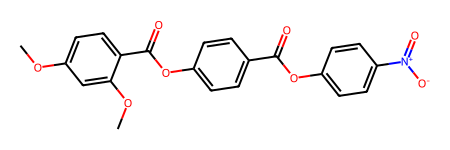

Input molecules in group-selfies:
[:0Resorcinol dimethylether][Ring2][:0Ester][Ring1][:0Benzene][Branch][:0Ester][Ring1][:0Benzene][Branch][:0NO2][pop][pop][pop][pop][pop]

Fragments of input molecule:


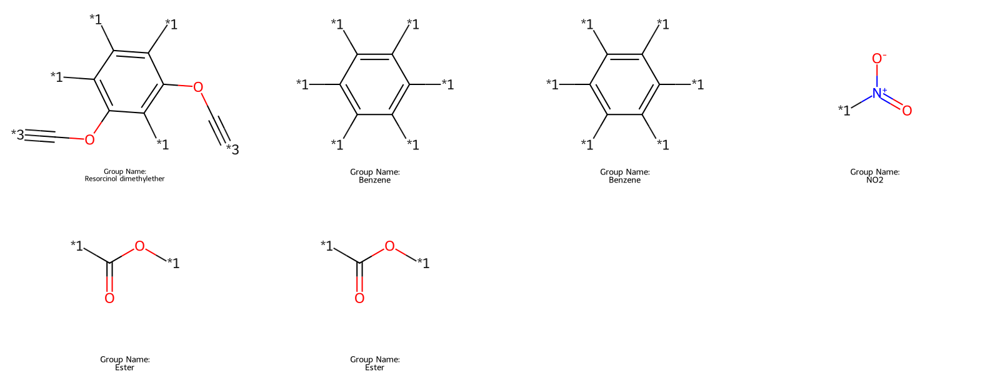

replacement of [:0Benzene] at Idx = 8 with [:0Bicyclo<3.3.1>nonane][Branch][:2Indene][Branch][:1Seleno][:4Bicyclo<1.1.1>pentane][Branch]
Current Fragments:
7  [Ring1]
8  [:0Benzene] <-- ** REPLACE **
9  [Branch]


Current Grammar:
[:0Resorcinol dimethylether][Ring2][:0Ester][Ring1][:0Benzene][Branch][:0Ester][Ring1][:0Bicyclo<3.3.1>nonane][Ring1][:0Benzene][Branch][:0Seleno][Ring1][:0NO2][pop][pop][Ring2][:0C2H2][Ring1][:1CH2][Ring1][Ring1][O][pop][pop][pop][pop][pop][pop][pop][pop]


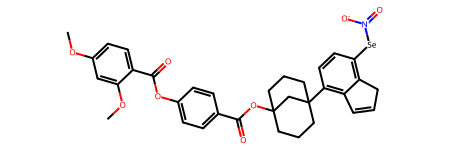

Insertion of [:8Cyclononane][Branch][:0C8H16][:0Branch3][:4Pyrroline(3)][Branch] at Idx = 10
Current Fragments:
9  [Ring1]
** INSERTING HERE **
10  [:0Benzene]
11  [Branch]


Current Grammar:
[:0Methyl][C][:0C2H2][Ring1][:0Benzene][Ring2][:0Seleno][Ring1][:0NO2][pop][pop][Branch][:4Pyrroline(3)][Branch][:0C8H16][Ring1][:0Cyclononane][O][:0Bicyclo<3.3.1>nonane][Ring1][:1Ester][Ring1][:0Benzene][Branch][:1Ester][Ring1][:2Resorcinol dimethylether][pop][pop][pop][pop][pop][pop][pop][pop][pop][pop]


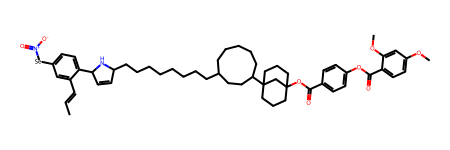

Insertion of [:3Pyrroline(2)][Branch][:0C7F15][:1CF2CH2][:1Pyrimidine][Branch] at Idx = 17
Current Fragments:
16  [:0Cyclononane]
** INSERTING HERE **
17  [O]
18  [:0Bicyclo<3.3.1>nonane]


Current Grammar:
[:0Methyl][C][:0C2H2][Ring1][:0Benzene][Ring2][:0Seleno][Ring1][:0NO2][pop][pop][Branch][:4Pyrroline(3)][Branch][:0C8H16][Ring1][:0Cyclononane][N][:0Oxy][Ring1][:0Bicyclo<3.3.1>nonane][Ring1][:1Ester][Ring1][:0Benzene][Branch][:1Ester][Ring1][:2Resorcinol dimethylether][pop][pop][pop][pop][pop][pop][Ring1][:0C7F15][pop][pop][pop][pop][pop][pop]


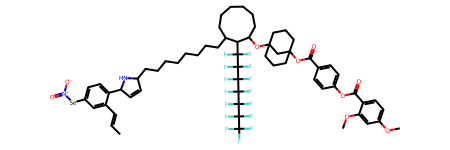

Insertion of [:3Pyran][Branch] at Idx = 17
Current Fragments:
16  [:0Cyclononane]
** INSERTING HERE **
17  [N]
18  [:0Oxy]


Current Grammar:
[:0Methyl][C][:0C2H2][Ring1][:0Benzene][Ring2][:0Seleno][Ring1][:0NO2][pop][pop][Branch][:4Pyrroline(3)][Branch][:0C8H16][Ring1][:0Cyclononane][N][:0C7F15][pop][Ring1][N][:0Oxy][Ring1][:0Bicyclo<3.3.1>nonane][Ring1][:1Ester][Ring1][:0Benzene][Branch][:1Ester][Ring1][:2Resorcinol dimethylether][pop][pop][pop][pop][pop][pop][pop][pop][pop][pop][pop]


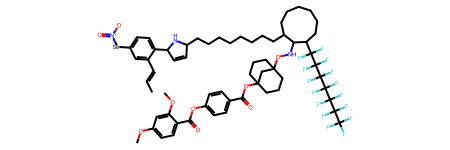

Insertion of [:2Benzofuran][Branch][:5Benzene][Branch] at Idx = 26
Current Fragments:
25  [Ring1]
** INSERTING HERE **
26  [:1Ester]
27  [Ring1]


Current Grammar:
[:0Methyl][C][:0C2H2][Ring1][:0Benzene][Ring2][:0Seleno][Ring1][:0NO2][pop][pop][Branch][:4Pyrroline(3)][Branch][:0C8H16][Ring1][:0Cyclononane][N][:0C7F15][pop][Ring1][N][:0Oxy][Ring1][:0Bicyclo<3.3.1>nonane][Ring1][:0Benzene][Ring2][:0C2H2][Ring1][:0Oxy][Ring1][Ring1][N][pop][pop][pop][Ring1][:0Benzene][Branch][:1Ester][Ring1][:0Benzene][Branch][:1Ester][Ring1][:2Resorcinol dimethylether][pop][pop][pop][pop][pop][pop][pop][pop][pop][pop][pop][pop][pop]


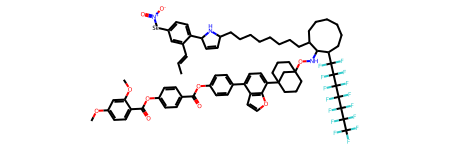

Insertion of [:2Pyrroline(2)][Branch][:4Pyrroline(3)][Branch][:0TIPS][:1Azulene][Branch] at Idx = 26
Current Fragments:
25  [Ring1]
** INSERTING HERE **
26  [:0Benzene]
27  [Ring2]


Current Grammar:
[:0Methyl][C][:0C2H2][Ring1][:0Benzene][Ring2][:0Seleno][Ring1][:0NO2][pop][pop][Branch][:4Pyrroline(3)][Branch][:0C8H16][Ring1][:0Cyclononane][N][:0C7F15][pop][Ring1][N][:0Oxy][Ring1][:0Bicyclo<3.3.1>nonane][Ring1][:2Pyrroline(2)][Branch][:2Pyrroline(3)][=Branch][:0Benzene][Branch][:0Benzene][Branch][:1Ester][Ring1][:0Benzene][Branch][:1Ester][Ring1][:2Resorcinol dimethylether][pop][pop][pop][pop][pop][Ring1][:0C2H2][Ring1][:0Oxy][pop][pop][pop][Branch][:0TIPS][pop][pop][pop][pop][pop][pop][pop][pop][pop][pop]


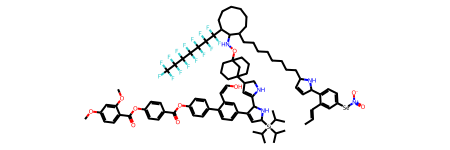

Final generated molecule above


In [18]:
Smi734 = 'COc3ccc(C(=O)Oc2ccc(C(=O)Oc1ccc(N(=O)(=O))cc1)cc2)c(OC)c3' # input smiles string
Mol =  Chem.MolFromSmiles(Smi734)                                    # convert to mol
display(Mol)                                                        # display it
print('Input molecules in group-selfies:')
print(str(Grammar.encoder(Mol, Grammar.extract_groups(Mol))))

Fragments = Grammar.extract_groups(Mol)                              # Get fragment info

# uncomment to see the fragments
print('\nFragments of input molecule:')
GroupLabel=[]
GroupFragment=[]
for group, _, _ in Fragments:                                        # Extract fragments and their names
    GroupLabel.append('Group Name:\n' + group.name)
    GroupFragment.append(group.mol)

    
display(Draw.MolsToGridImage(GroupFragment, molsPerRow=4, legends=GroupLabel, subImgSize=(400,300), maxMols=12)) # draw

# make a new molecule via group-selfies
NewStructure = grpsel.RandomGSel(Mol,
                                 Grammar,
                                 Silent=False,
                                Continues=3,
                                AddChances=5,
                                BranchChances=0,
                                InsertChance=75,
                                ReplaceChance=20,
                                Cleanup=True) 

### 10.Combined Genetic Algorithm and Fragment Based Structure Generation
Here we implement a genetic search algorithm to generate new molecular species algorithmically, but using a fragment based method that draws on our library of LC molecules. In this example we use the wonderful LC material RM734, but you can change the smiles string (_smi_) to whatever you like. <br><br> 
We are going to generate loads of structures using the fragment based method and score them with a fingerprinting method. The top 10 in each generation will be used to seed a new round of generation, but this is arbitrary; we could set it to 10^6 if we wanted. 
We specify, with some overlap with our earlier GA:<br>
_Generations_ - the number of generations<br>
_Continues_   - with n continues there is a n/(n+1) chance that another mutation occurs. The larger the number, the more changes made to the molecule(s). <br>
_Threshold_   - the midpoint of scoring that will remain after filtering<br>
_Range_       - the range we can deviated from _Threshold_ (i.e. +/-)<br>
_method_      - the fingerprinting method used, e.g. FCFP6; these are builtin to rdkit<br>
_samples_     - the number of samples to take; correlates to number of structures generated, but these might be filtered if not unique to that given Generation <br>
<br>
The returned lists _AllSmi_ and _AllScores_ contain smiles strings and scores for all non-filtered molecules. The list _AllLabels_ is basically just used for plotting so we can see if the same 'things' appear cross-generationally.<br><br>

Lastly, we save the resulting array to .csv for retrieval.

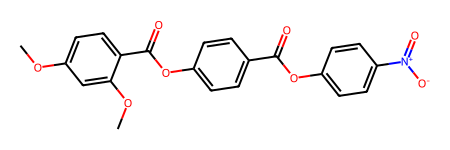

Generation 0 is seeded by 1 initial molecule
Generation 0 had 20 problematic molecules, out of 250 (8.0%)

Generation 1 is seeded by 10 initial molecules
Generation 1 had 0 problematic molecules, out of 250 (0.0%)

Generation 2 is seeded by 10 initial molecules
Generation 2 had 0 problematic molecules, out of 250 (0.0%)

Generation 3 is seeded by 10 initial molecules
Generation 3 had 0 problematic molecules, out of 250 (0.0%)

Generation 4 is seeded by 10 initial molecules
Generation 4 had 0 problematic molecules, out of 250 (0.0%)



C:\ProgramData\Anaconda3\envs\stoned2\Lib\site-packages\rdkit\Chem\Draw\IPythonConsole.py:258: UserWarning: Truncating the list of molecules to be displayed to 100. Change the maxMols value to display more.
  warnings.warn(


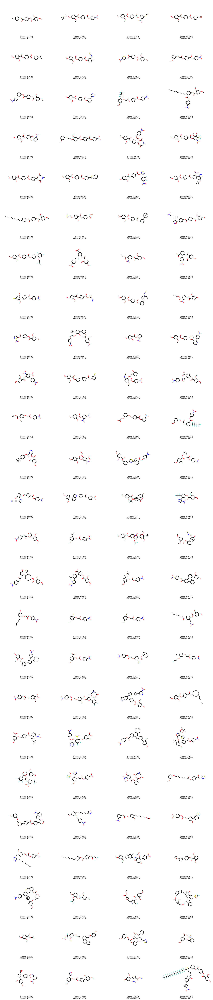

saved structures and scores as FragmentBasedGeneticSearch.csv


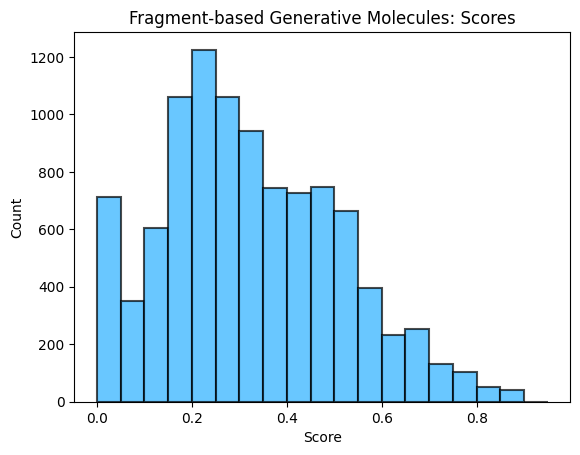

In [19]:
smi = 'COc3ccc(C(=O)Oc2ccc(C(=O)Oc1ccc(N(=O)(=O))cc1)cc2)c(OC)c3'
Mol =  Chem.MolFromSmiles(smi)
Fragments = Grammar.extract_groups(Mol)

display(Mol)

# set some parameters that control how our genetic search works
# Search Parameters:
Generations = 5  # number of generations to screen
Continues = 4    # how many mutations will happen per molecule (on average)
AddChances=4     # each insert/replace will include "up to" this number of fragents
BranchChances=1  # each insert/replace will include "up to" this number of branches
samples = 250    # we'll try to generate this number of legit molecules for each seed
InsertChance=75  # the percentage chance that we'll insert a fragment
ReplaceChance=20 # the percentage chance that we'll replace a fragment
#note, the % chance we'll delete a fragment is 100-(InsertChance+ReplaceChance)!

# Filter Parameters:
Threshold = 0.5  # threshold midpoint for filter
Range = 0.5     # threshold range
MeshSize = 10    # number of moleucles that pass through filter to next round

#Score Method:
method='FCFP6'   # scoring method (builtin; call external using the ExternalScore module)

# Initialize the lists we'll use:
InitialSmi = []  # stores our 'seed' molecular structures
NewSmi  = []     # this stores the new structures we make in a run
AllSmi = []      # this stores ALL the structures we generate
AllScores =[]    # this holds the scores for structures in AllSmi
AllLabels =[]    # this stores label information (Score, generation#) for a given structure

for n in range(0,Generations): # loop over all generations
    
    if n == 0:
        InitialSmi = [smi]  # in the first generation, our 'seed' molecule (InitialSmi) is just the starting moleucle (smi)
    
    if n != 0:
        InitialSmi = NewSmi # in other generations our 'seed' is the top scorers from the previous run (NewSmi)
    
    NewSmi = [] # reset this before each new generation
        
    print('Generation ' + str(n) + ' is seeded by ' + str(len(InitialSmi)) + ' initial molecule' + 's' * (n != 0))
    
    for smiles in InitialSmi:            # loop over all seed molecules
        Check = 0                        # Check keeps count of broken structures
        
        while len(NewSmi) < samples:     # Keep generating new structures until we have our target number (Samples)
            try:
                #grpsel.RandomGSel is our generative engine.
                NewGrammar = grpsel.RandomGSel(Mol, 
                                     Grammar,
                                     Silent=True,
                                    Continues=Continues,
                                    AddChances=AddChances,  
                                    BranchChances=BranchChances,
                                    InsertChance=InsertChance,
                                    ReplaceChance=ReplaceChance,
                                    Cleanup=False) 

                NewSmi.append(Chem.MolToSmiles(NewGrammar))
            
            except:
                Check = Check+1 #keeps count of problematic structures
                     
        Scores = gensel.get_fp_scores(NewSmi,     
                                  target_smi=smi, 
                                  fp_type=method)
        
        Filtered,FilteredScores=filmol.FilterScore(NewSmi,
                                                   Scores,
                                                   Sort=True,
                                                   silent=True,
                                                   Unique=True,
                                                   Threshold=Threshold,
                                                   Range=Range)

        AllLabels += [('\nGeneration : ' + str(n))] * len(FilteredScores)
        AllScores += FilteredScores
        AllSmi += Filtered
        
    print('Generation ' + str(n) + ' had ' + str(Check) + ' problematic molecules, out of ' + str(len(NewSmi)) + ' (' + str((Check)/len(NewSmi)*100) + '%)\n')

    NewSmi = Filtered[0:MeshSize] # top ones from this cycle (defined by range 0:Meshsize) go forwards
    
if True:
    #make a legend (Ledge) for the grid plot:
    b = ['Score: ' + str(np.round(Score,4)) for Score in AllScores]
    a = ['\n' + LocalLabel for LocalLabel in AllLabels]
    Ledge = (["{}{:02}".format(b_, a_) for a_, b_ in zip(a, b)])
    
    #use the MolToGridImage engine for plotting:
    display(Draw.MolsToGridImage([Chem.MolFromSmiles(x) for x in AllSmi],          # draw 
                           molsPerRow=4, 
                           legends=Ledge,
                           subImgSize=(400,300),
                           maxMols=100))
    
    filmol.SaveSmilesScores(AllSmi,AllScores,'FragmentBasedGeneticSearch.csv')

    #Show results as a histogram of scores (i.e. canon_smi_ls_scores)
    fig, ax = plt.subplots()
    ax.hist(AllScores,bins=np.arange(0,1,0.05), facecolor='#2ab0ff', edgecolor='k', linewidth=1.5, alpha=0.7)

    plt.ylabel('Count')
    plt.xlabel('Score')
    plt.title('Fragment-based Generative Molecules: Scores')

We can also use the same filtering tools that we encountered earlier. For example, here we look at the output to see if any returned molecules have a NCS functional group by first removing any non-unique entries with FilterUnique from _filmol_ and then using the  SubstructureFilter function from the _filmol_ module:

I looked at 1199 molecules to find those with the substructure: N=C=S
Total of 1175 molecules have no substructure match
Total of 24 molecules have a substructure match


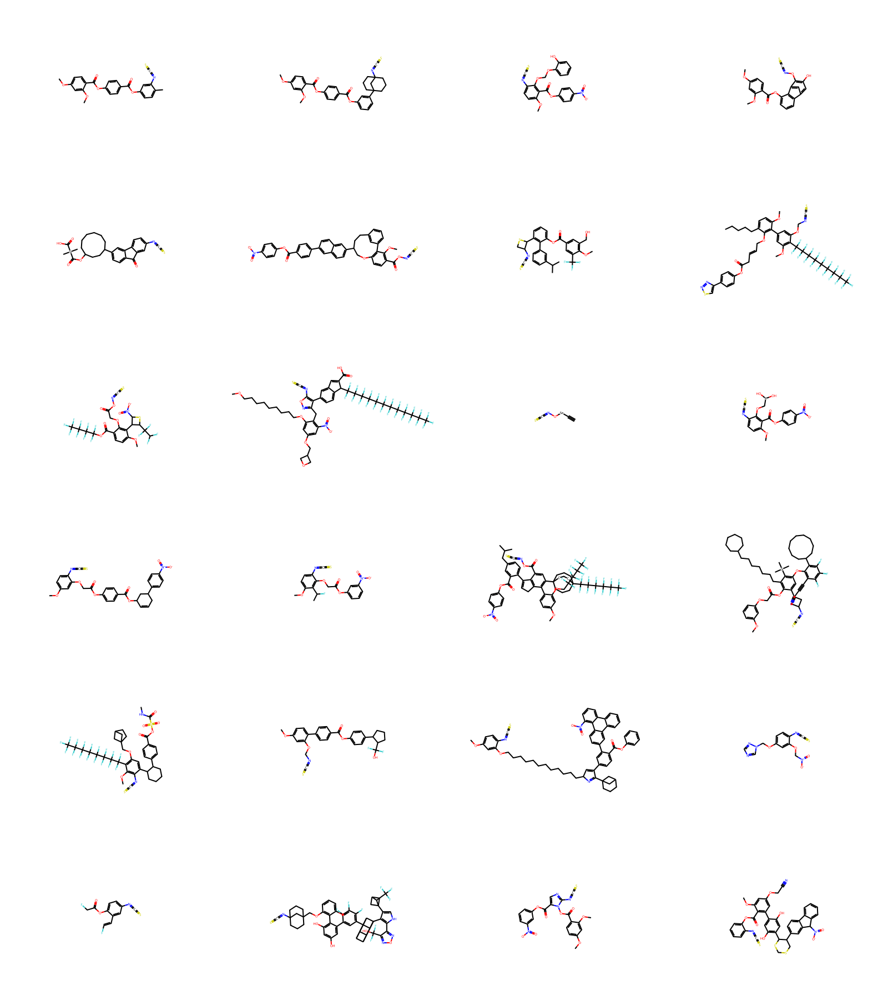

In [20]:
UniqueSmi,UniqueScores = filmol.FilterUnique(AllSmi,AllScores)

Hits,_ = filmol.SubstructureFilter(UniqueSmi,'N=C=S')